# DAFTspot Example Code: mouse brain 
## (10x Visium of anterior mouse brain + scRNA-seq data of mouse brain)

In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import seaborn as sns
import da_cellfraction
from utils import random_mix
from sklearn.manifold import TSNE

Using TensorFlow backend.
/home/user/anaconda3/envs/bioinfo_keras/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/user/anaconda3/envs/bioinfo_keras/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/user/anaconda3/envs/bioinfo_keras/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home

## 1. Data load
### load scanpy data - 10x datasets

In [2]:
sc.logging.print_versions()
sc.set_figure_params(facecolor="white", figsize=(8, 8))
sc.settings.verbosity = 3

adata_spatial_anterior = sc.datasets.visium_sge(
    sample_id="V1_Mouse_Brain_Sagittal_Anterior"
)
adata_spatial_posterior = sc.datasets.visium_sge(
    sample_id="V1_Mouse_Brain_Sagittal_Posterior"
)

#Normalize and log1P
for adata in [
    adata_spatial_anterior,
    adata_spatial_posterior,
]:
    sc.pp.normalize_total(adata, inplace=True)
sc.logging.print_versions()
sc.set_figure_params(facecolor="white", figsize=(8, 8))
sc.settings.verbosity = 3

adata_spatial_anterior = sc.datasets.visium_sge(
    sample_id="V1_Mouse_Brain_Sagittal_Anterior"
)
adata_spatial_posterior = sc.datasets.visium_sge(
    sample_id="V1_Mouse_Brain_Sagittal_Posterior"
)

#Normalize
for adata in [
    adata_spatial_anterior,
    adata_spatial_posterior,
]:
    sc.pp.normalize_total(adata, inplace=True)

scanpy==1.5.1 anndata==0.7.3 umap==0.4.6 numpy==1.17.0 scipy==1.5.1 pandas==0.25.0 scikit-learn==0.21.2 statsmodels==0.11.1 python-igraph==0.8.2 leidenalg==0.8.1
reading /home/user/Data1/Data/Spatial10xdata/Tmp_Scanpy/LabelTransfer_DA/data/V1_Mouse_Brain_Sagittal_Anterior/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading /home/user/Data1/Data/Spatial10xdata/Tmp_Scanpy/LabelTransfer_DA/data/V1_Mouse_Brain_Sagittal_Posterior/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
scanpy==1.5.1 anndata==0.7.3 umap==0.4.6 numpy==1.17.0 scipy==1.5.1 pandas==0.25.0 scikit-learn==0.21.2 statsmodels==0.11.1 python-igraph==0.8.2 leidenalg==0.8.1
reading /home/user/Data1/Data/Spatial10xdata/Tmp_Scanpy/LabelTransfer_DA/data/V1_Mouse_Brain_Sagittal_Anterior/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading /home/user/Data1/Data/Spatial10xdata/Tmp_Scanpy/LabelTransfer_DA/data/V1_Mouse_Brain_Sagittal_Posterior/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)


### Single cell Data: GSE115746 
 - Download from GEO and use two files "GSE115746_cells_exon_counts.csv" and "GSE115746_complete_metadata_28706-cells.csv"

In [3]:
adata_cortex = sc.read_csv('../data/GSE115746_cells_exon_counts.csv').T
adata_cortex_meta = pd.read_csv('../data/GSE115746_complete_metadata_28706-cells.csv', index_col=0)
adata_cortex_meta_ = adata_cortex_meta.loc[adata_cortex.obs.index,]

adata_cortex.obs = adata_cortex_meta_
adata_cortex.var_names_make_unique()  


normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:43)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:07)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:14)
running Leiden clustering
    finished: found 24 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


... storing 'source_name' as categorical
... storing 'organism' as categorical
... storing 'donor_id' as categorical
... storing 'donor_sex' as categorical
... storing 'donor_genotype' as categorical
... storing 'injection_type' as categorical
... storing 'injection_target' as categorical
... storing 'injected_material' as categorical
... storing 'dissected_region' as categorical
... storing 'dissected_layer' as categorical
... storing 'facs_gating' as categorical
... storing 'facs_date' as categorical
... storing 'rna_amplification_set' as categorical
... storing 'sequencing_tube' as categorical
... storing 'sequencing_batch' as categorical
... storing 'sequencing_qc_pass_fail' as categorical
... storing 'cell_class' as categorical
... storing 'cell_subclass' as categorical
... storing 'cell_cluster' as categorical
... storing 'molecule' as categorical
... storing 'GEO_Sample' as categorical
... storing 'GEO_Sample_Title' as categorical


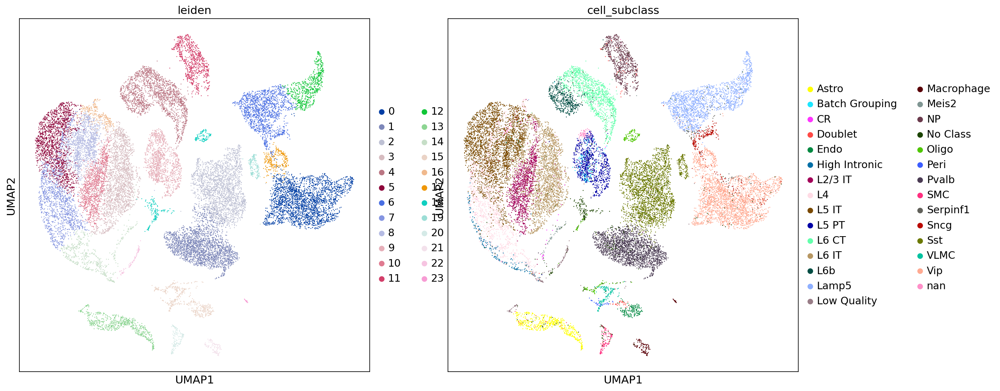

In [4]:
#Preprocessing
adata_cortex.var['mt'] = adata_cortex.var_names.str.startswith('Mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata_cortex, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

sc.pp.normalize_total(adata_cortex)
#sc.pp.log1p(adata_cortex)
#sc.pp.highly_variable_genes(adata_cortex,flavor="seurat", n_top_genes=2000, inplace=True)

#PCA and clustering
sc.tl.pca(adata_cortex, svd_solver='arpack')
sc.pp.neighbors(adata_cortex, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata_cortex)
sc.tl.leiden(adata_cortex, resolution = 0.5)
sc.pl.umap(adata_cortex, color=['leiden','cell_subclass'])


- Select same gene features 

In [5]:
adata_spatial_anterior.var_names_make_unique() 
inter_genes = [val for val in adata_cortex.var.index if val in adata_spatial_anterior.var.index]
adata_cortex = adata_cortex[:,inter_genes]

adata_spatial_anterior = adata_spatial_anterior[:,inter_genes]


### Array of single cell & spatial data
- Single cell data with labels
- Spatial data without labels


In [6]:
mat_sc = adata_cortex.X
mat_sp = adata_spatial_anterior.X.todense()

df_sc = adata_cortex.obs
lab_sc = np.asarray(df_sc.leiden, dtype='int')

lab_sc_sub = df_sc.cell_subclass
sc_sub_dict = dict(zip(range(len(set(lab_sc_sub))), set(lab_sc_sub)))
sc_sub_dict2 = dict((y,x) for x,y in sc_sub_dict.items())
lab_sc_num = [sc_sub_dict2[ii] for ii in lab_sc_sub]
lab_sc_num = np.asarray(lab_sc_num, dtype='int')

## 2. Generate mixture from single cell data and preprocessing

In [7]:
sc_mix, lab_mix = random_mix(mat_sc, lab_sc_num, nmix=5, n_samples=2000)

def log_minmaxscale(arr):
    arrd = len(arr)
    arr = np.log1p(arr)
    return (arr-np.reshape(np.min(arr,axis=1), (arrd,1)))/np.reshape((np.max(arr, axis=1)-np.min(arr,axis=1)),(arrd,1))

sc_mix_s = log_minmaxscale(sc_mix)
mat_sp_s = log_minmaxscale(mat_sp)
mat_sc_s = log_minmaxscale(mat_sc)


## 3. Training: Adversarial domain adaptation for cell fraction estimation
### Parameters
- alpha: loss weights for adversarial learning for pooling domain classifier
- alpha_lr: learning rate for training domain classifier  (alpha_lr *0.001)
- emb_dim: embedding dimension (feature dimension)
- batch_size : batch size for the training
- n_iterations: iteration number of adversarial training
- initial_train: if true, classifier model is trained firstly before adversarial domain adaptation
- initial_train_epochs: number of epochs for inital training



In [8]:
embs, clssmodel = da_cellfraction.train(sc_mix_s, lab_mix, mat_sp_s, 
                                 alpha=1, alpha_lr=10, emb_dim = 64, batch_size = 512,
                                 n_iterations = 2000,
                                  initial_train=True,
                                  initial_train_epochs=10)

W0806 14:06:26.681168 139830028297984 deprecation_wrapper.py:119] From /home/user/anaconda3/envs/bioinfo_keras/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:74: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0806 14:06:26.690797 139830028297984 deprecation_wrapper.py:119] From /home/user/anaconda3/envs/bioinfo_keras/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0806 14:06:26.692843 139830028297984 deprecation_wrapper.py:119] From /home/user/anaconda3/envs/bioinfo_keras/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W0806 14:06:26.739286 139830028297984 deprecation_wrapper.py:119] From /home/user/anaconda3/envs/bioinfo_keras/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:133: The name tf.place

Epoch 1/10
2000/2000 [==============================] - 2s 784us/step - loss: 1.5577 - mean_absolute_error: 0.0426
Epoch 2/10
2000/2000 [==============================] - 0s 143us/step - loss: 0.8248 - mean_absolute_error: 0.0302
Epoch 3/10
2000/2000 [==============================] - 0s 138us/step - loss: 0.6877 - mean_absolute_error: 0.0275
Epoch 4/10
2000/2000 [==============================] - 0s 138us/step - loss: 0.5932 - mean_absolute_error: 0.0251
Epoch 5/10
2000/2000 [==============================] - 0s 138us/step - loss: 0.5185 - mean_absolute_error: 0.0229
Epoch 6/10
2000/2000 [==============================] - 0s 138us/step - loss: 0.4570 - mean_absolute_error: 0.0211
Epoch 7/10
2000/2000 [==============================] - 0s 145us/step - loss: 0.4031 - mean_absolute_error: 0.0192
Epoch 8/10
2000/2000 [==============================] - 0s 145us/step - loss: 0.3573 - mean_absolute_error: 0.0176
Epoch 9/10
2000/2000 [==============================] - 0s 144us/step - loss: 0.

## 4. Predict cell fraction of spots and visualization

{0: 'No Class', 1: 'Doublet', 2: 'L4', 3: 'Macrophage', 4: 'L6 IT', 5: 'Batch Grouping', 6: 'L2/3 IT', 7: 'Sncg', 8: 'Sst', 9: 'Vip', 10: 'Pvalb', 11: 'High Intronic', 12: 'NP', 13: 'L6 CT', 14: 'Lamp5', 15: 'Endo', 16: 'nan', 17: 'CR', 18: 'VLMC', 19: 'Astro', 20: 'L6b', 21: 'L5 IT', 22: 'L5 PT', 23: 'Meis2', 24: 'SMC', 25: 'Peri', 26: 'Low Quality', 27: 'Serpinf1', 28: 'Oligo'}


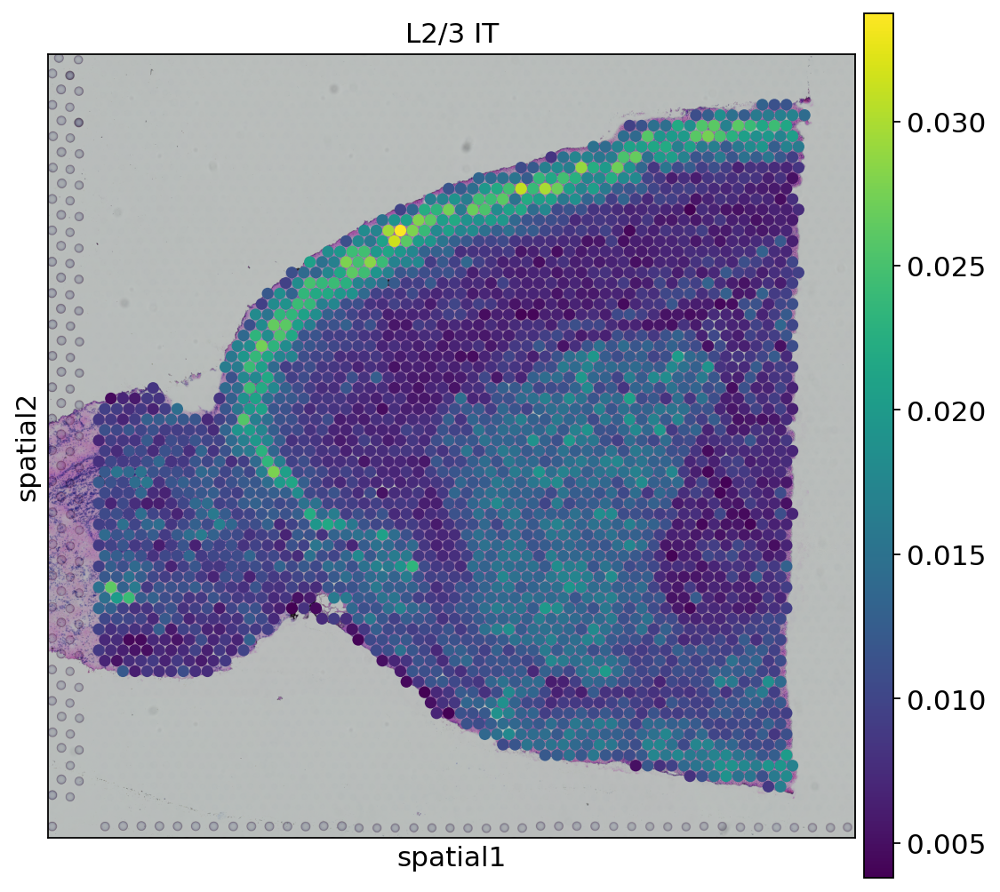

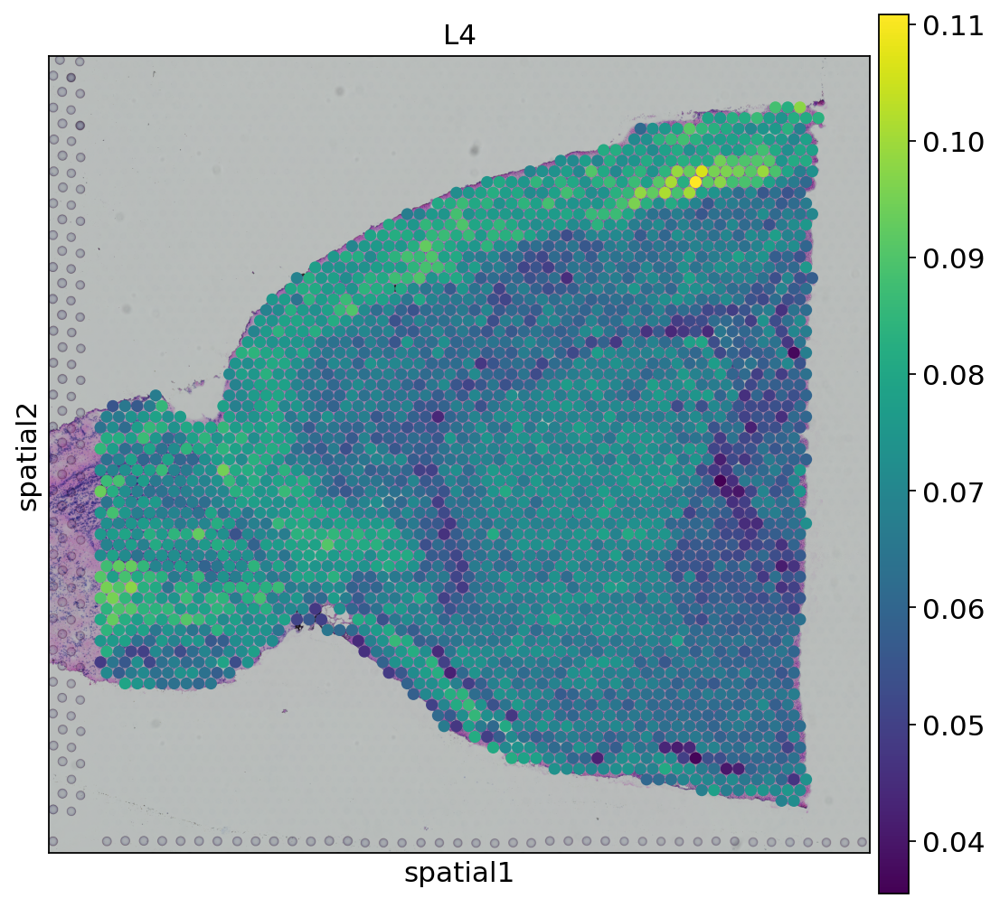

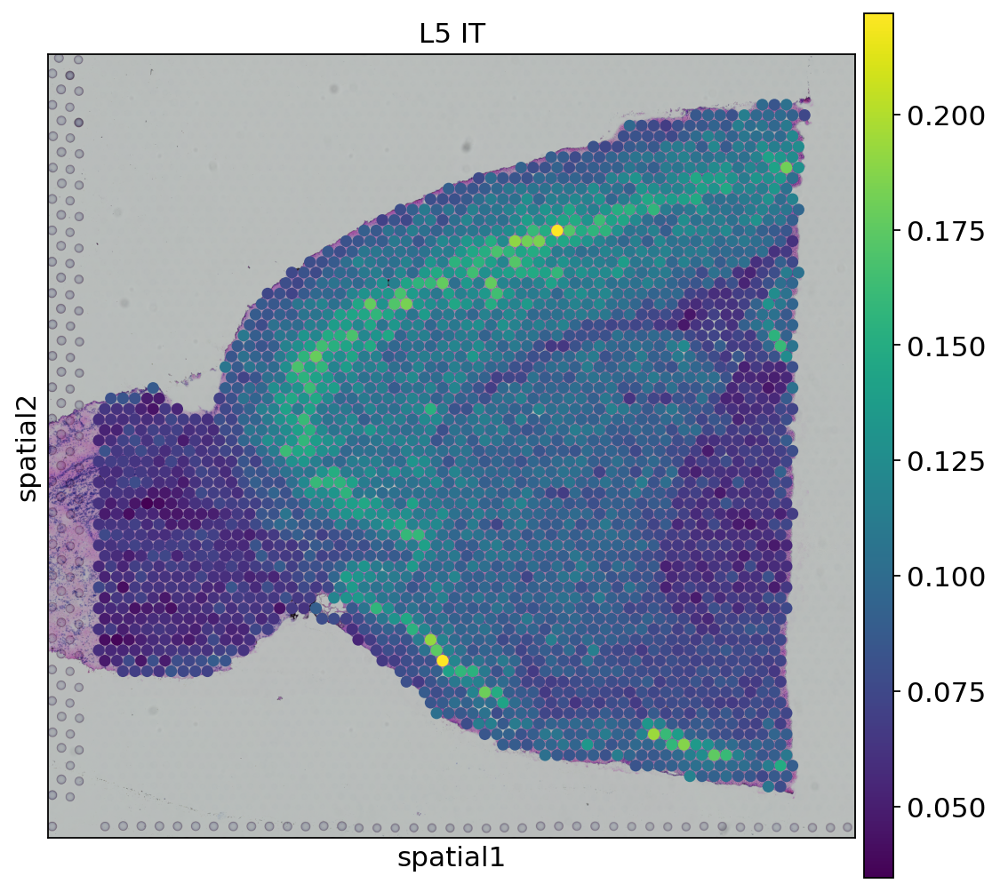

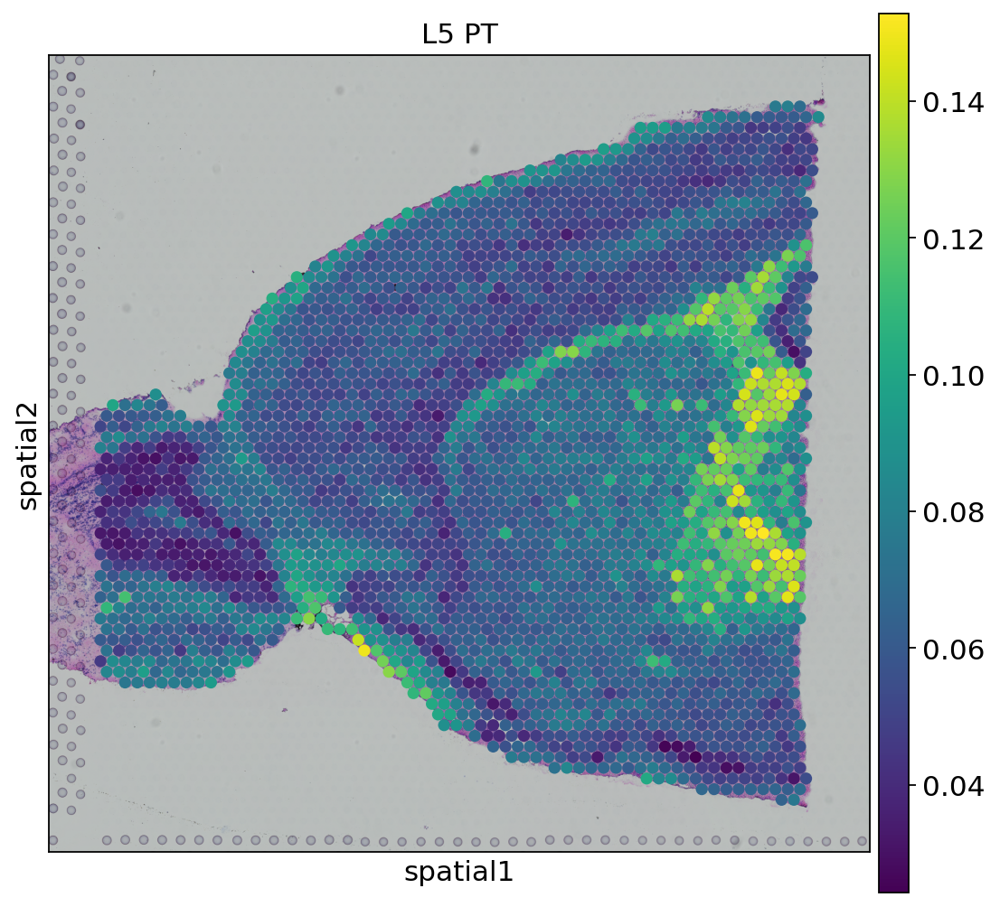

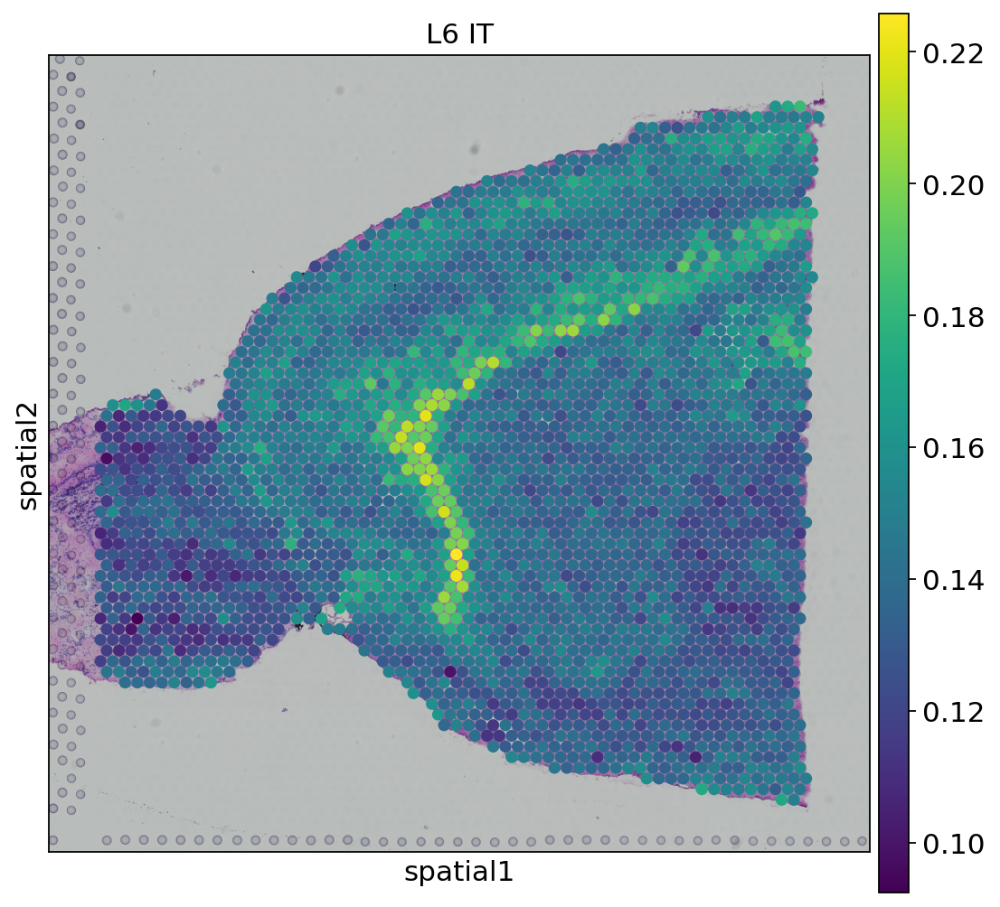

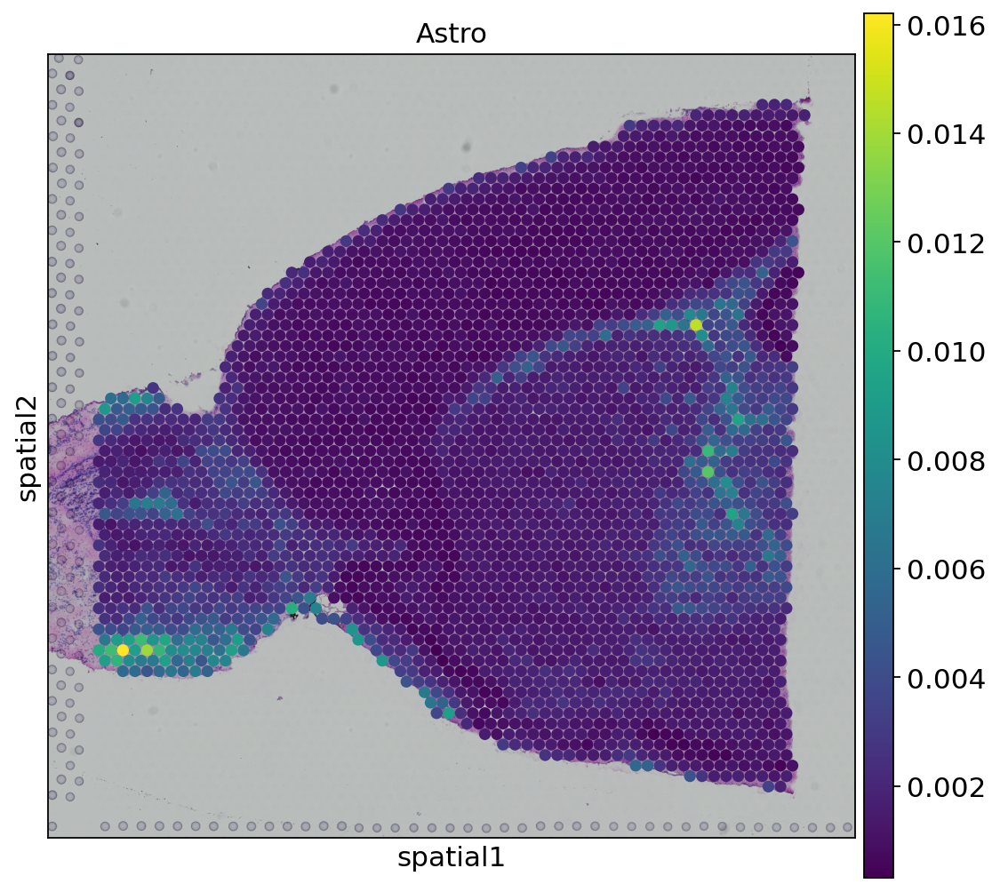

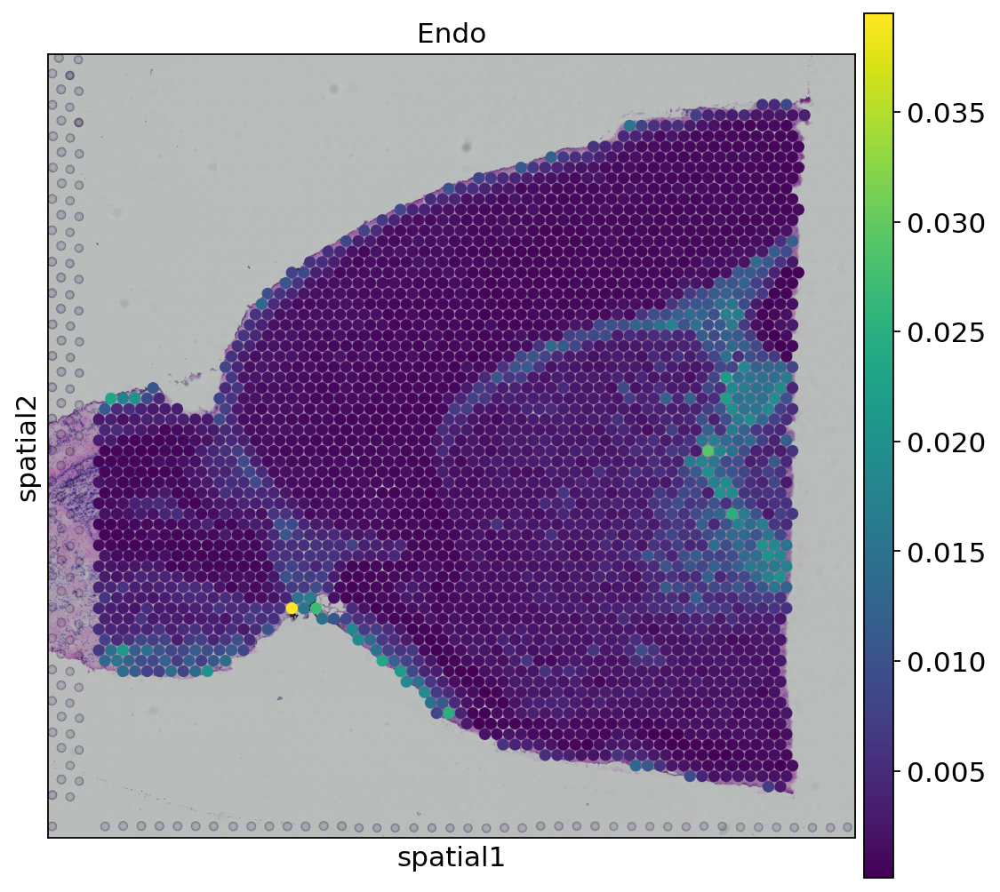

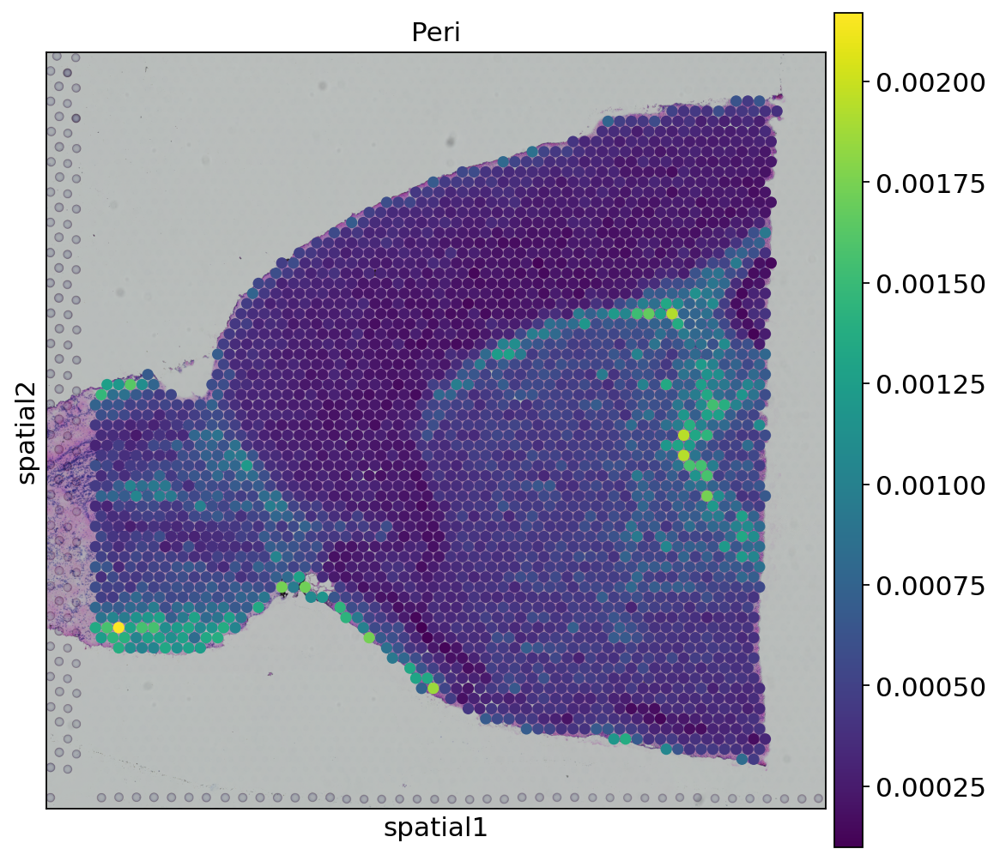

In [13]:
pred_sp = clssmodel.predict(mat_sp_s)

def plot_cellfraction(visnum):
    adata_spatial_anterior.obs['Pred_label'] = pred_sp[:,visnum]
    sc.pl.spatial(
        adata_spatial_anterior,
        img_key="hires",
        color='Pred_label',
        palette='Set1',
        size=1.5,
        legend_loc=None,
        title = sc_sub_dict[visnum])

print(sc_sub_dict)
numlist = [6,2,21,22,4,19, 15, 25]

for num in numlist:
    plot_cellfraction(num)

- cf. embbedded features


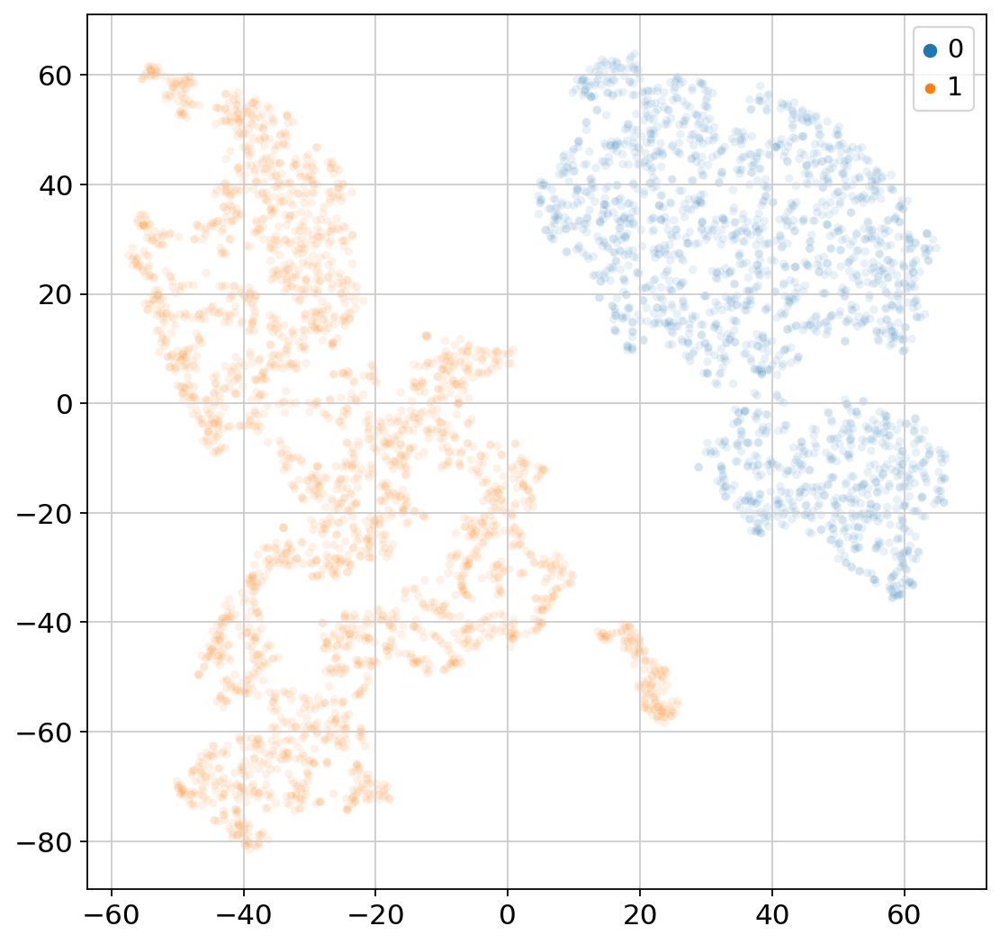

In [14]:
z_sc = embs.predict(mat_sc_s)
z_mix = embs.predict(sc_mix_s)
z_sp = embs.predict(mat_sp_s)

pred_mix = clssmodel.predict(sc_mix_s)

z_mixsp = np.concatenate([z_mix, z_sp], axis=0)
z_mixtsne = TSNE(n_components=2).fit_transform(z_mixsp)
sns.scatterplot(x=z_mixtsne[:,0], y= z_mixtsne[:,1],
                hue = [0]*z_mix.shape[0]+[1]*z_sp.shape[0], alpha=0.1, size=1,
                linewidth=0)


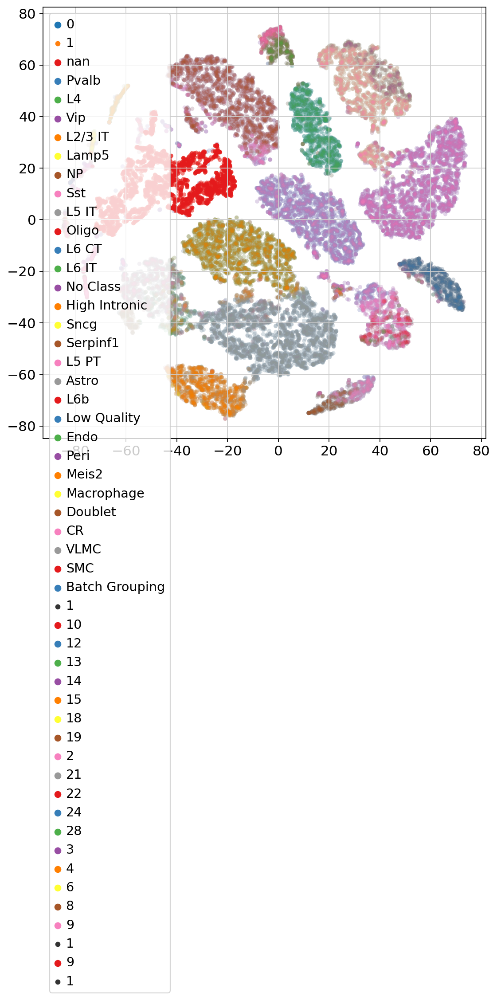

In [15]:
z_scsp= np.concatenate([z_sc,z_sp], axis=0)
z_tsne = TSNE(n_components=2).fit_transform(z_scsp)

sns.scatterplot(x=z_tsne[:,0], y= z_tsne[:,1],
                hue = [0]*z_sc.shape[0]+[1]*z_sp.shape[0], alpha=0.1, size=1,
                linewidth=0)

pred_sc = clssmodel.predict(mat_sc_s)
pred_sc_ = np.argmax(pred_sc, axis=1)

pred_sp = clssmodel.predict(mat_sp_s)
pred_sp_ = np.argmax(pred_sp, axis=1)

sns.scatterplot(x=z_tsne[:z_sc.shape[0],0], 
                y= z_tsne[:z_sc.shape[0],1],
                hue = [str(i) for i in lab_sc_sub.tolist()],
                palette = 'Set1',
                alpha=0.1, size=1,
                linewidth=0)



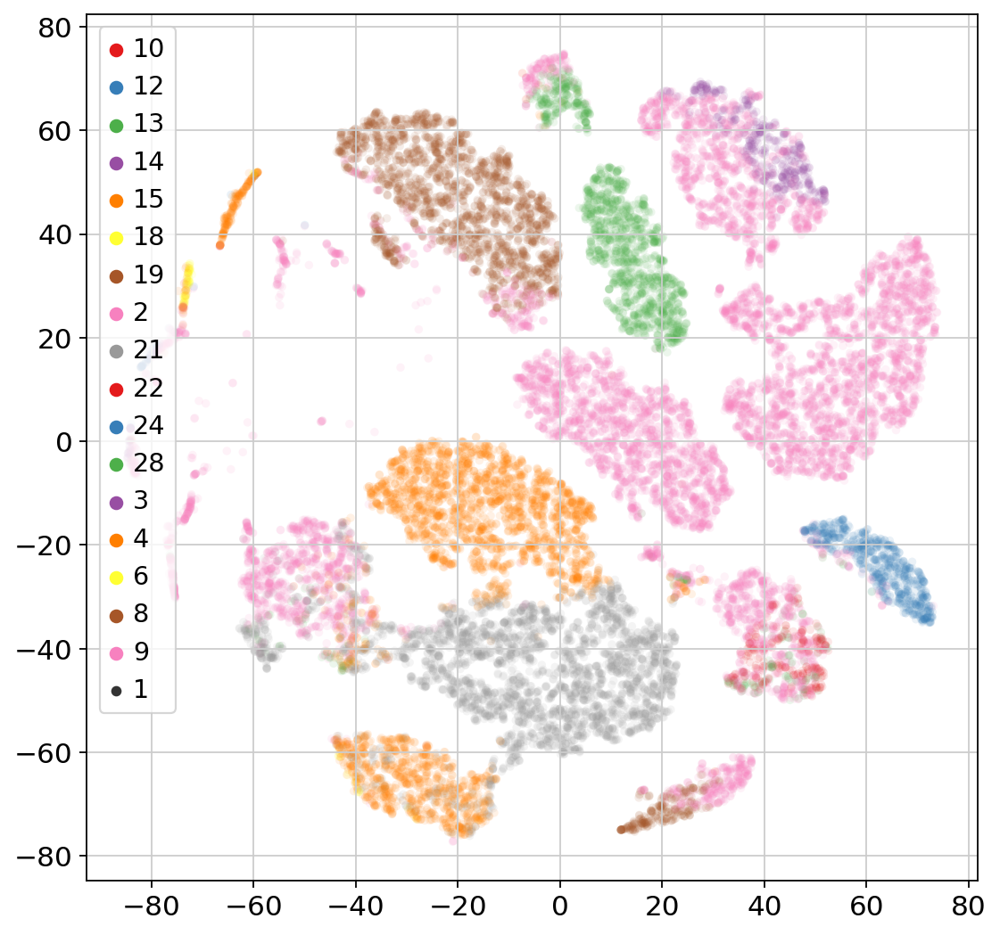

In [17]:

sns.scatterplot(x=z_tsne[:z_sc.shape[0],0], 
                y= z_tsne[:z_sc.shape[0],1],
                hue = [str(i) for i in pred_sc_.tolist()],
                palette = 'Set1',
                alpha=0.1, size=1,
                linewidth=0)


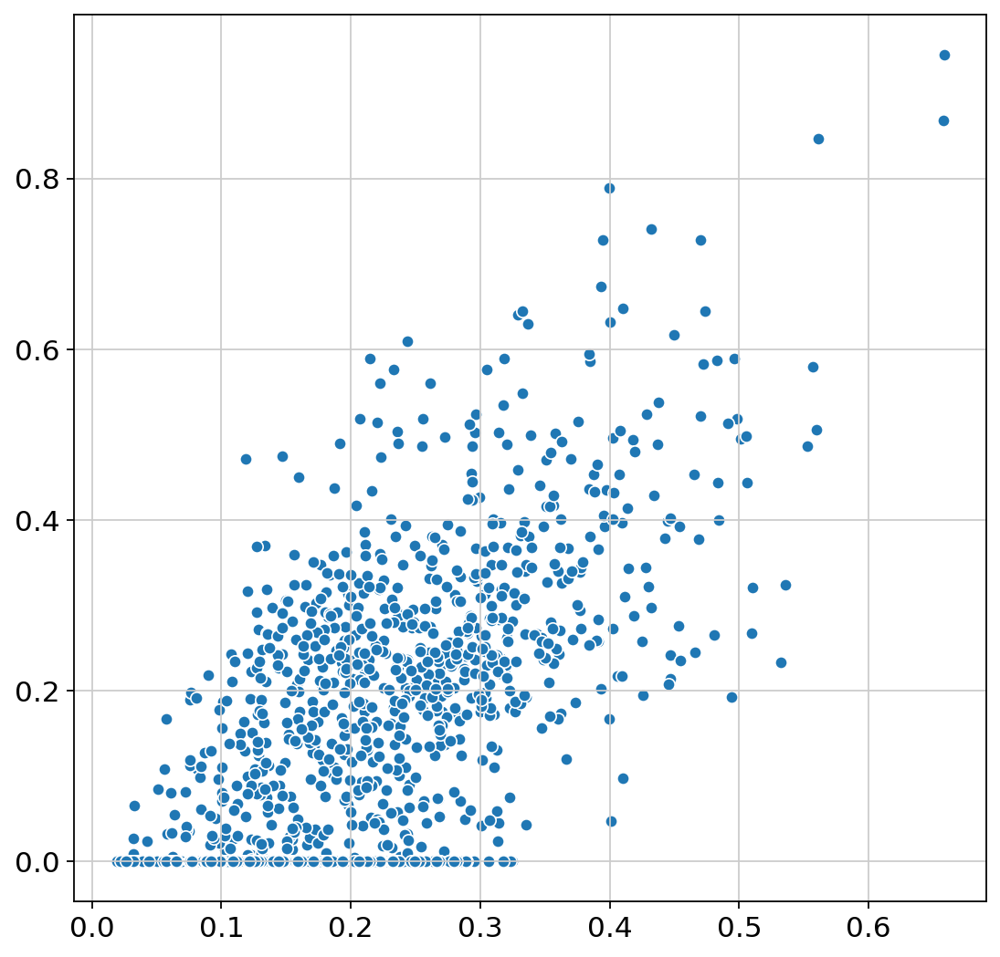

In [24]:
sns.scatterplot(pred_mix[:,4], lab_mix[:,4])